### **NLP Model with Markov Chains**

**library setting**

In [35]:
# library
import numpy as np
import pandas as pd
import os
import re
import random
import string
from IPython.display import display

# Token trasformation
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

# visualization
import matplotlib.pyplot as plt
import networkx as nx
from scipy.sparse import find


**1. upload file and read file .txt**

In [3]:
# setting config file to upload file path
from config import file_txt

with open(file_txt, 'r') as file:
   text = file.read()
   
print(text[:1000])

Chapter 1

I am by birth a Genevese, and my family is one of the most
distinguished of that republic.  My ancestors had been for many years
counsellors and syndics, and my father had filled several public
situations with honour and reputation.  He was respected by all who
knew him for his integrity and indefatigable attention to public
business.  He passed his younger days perpetually occupied by the
affairs of his country; a variety of circumstances had prevented his
marrying early, nor was it until the decline of life that he became a
husband and the father of a family.

As the circumstances of his marriage illustrate his character, I cannot
refrain from relating them.  One of his most intimate friends was a
merchant who, from a flourishing state, fell, through numerous
mischances, into poverty.  This man, whose name was Beaufort, was of a
proud and unbending disposition and could not bear to live in poverty
and oblivion in the same country where he had formerly been
distinguished fo

In [4]:
# Removes formatting and multiple spaces
def text_form(text):
   txt_clean = re.sub(r'\s+', ' ', text)
   txt_words = re.findall(r'\b\w+\b', txt_clean)
   return txt_words

txt_words = text_form(text)
print(f'Number of words:',len(txt_words))

Number of words: 69690


**2. Cleaning and arrangement of text in list**

In [5]:
# rows in line
def read_txt(file_txt):
   txt = []
   with open (file_txt) as f:
      for line in f:
         line = line.strip()
         if line != '': txt.append(line)
   return txt

rows_list = read_txt(file_txt)
print('Number of lines: ', len(rows_list))

Number of lines:  5941


In [28]:
display(rows_list[:30])

['Chapter 1',
 'I am by birth a Genevese, and my family is one of the most',
 'distinguished of that republic.  My ancestors had been for many years',
 'counsellors and syndics, and my father had filled several public',
 'situations with honour and reputation.  He was respected by all who',
 'knew him for his integrity and indefatigable attention to public',
 'business.  He passed his younger days perpetually occupied by the',
 'affairs of his country; a variety of circumstances had prevented his',
 'marrying early, nor was it until the decline of life that he became a',
 'husband and the father of a family.',
 'As the circumstances of his marriage illustrate his character, I cannot',
 'refrain from relating them.  One of his most intimate friends was a',
 'merchant who, from a flourishing state, fell, through numerous',
 'mischances, into poverty.  This man, whose name was Beaufort, was of a',
 'proud and unbending disposition and could not bear to live in poverty',
 'and oblivion in 

In [7]:
# removing special characters and transform words in token
def clean_txt(txt):
   cleaned_text = []
   for line in txt:
      line = line.lower()
      line = re.sub(r"[,.\"\'!@#$%^&*(){}?/;`~:<>+=-\\]", "", line)
      tokens = word_tokenize(line, language="english", preserve_line=True)
      words = [word for word in tokens if word.isalpha()]
      cleaned_text+= words
   return cleaned_text

cleaned_txt = clean_txt(rows_list)
print(f'number of tokenized words:',len(cleaned_txt))

number of tokenized words: 69389


In [29]:
display(cleaned_txt[:30])

['chapter',
 'i',
 'am',
 'by',
 'birth',
 'a',
 'genevese',
 'and',
 'my',
 'family',
 'is',
 'one',
 'of',
 'the',
 'most',
 'distinguished',
 'of',
 'that',
 'republic',
 'my',
 'ancestors',
 'had',
 'been',
 'for',
 'many',
 'years',
 'counsellors',
 'and',
 'syndics',
 'and']

**3. Markov Chain Model - Statistical Base NPL Model**

*The implemented Markov model is a probabilistic language model that captures the sequential structure of a set of texts. Specifically, the model analyzes the sequence of words within the clean texts provided and calculates the transition probabilities between n-grams, where an n-gram is a contiguous sequence of n words.*

In [9]:
# Defining the model
def MC_model1(cleaned_txt, n_gram=2):
    markov_model = {}
    for i in range(len(cleaned_txt)-n_gram-1):
        curr_state, next_state = "", ""
        for j in range(n_gram):
            curr_state += cleaned_txt[i+j] + " "
            next_state += cleaned_txt[i+j+n_gram] + " "
        curr_state = curr_state[:-1]
        next_state = next_state[:-1]
        if curr_state not in markov_model:
            markov_model[curr_state] = {}
            markov_model[curr_state][next_state] = 1
        else:
            if next_state in markov_model[curr_state]:
                markov_model[curr_state][next_state] += 1
            else:
                markov_model[curr_state][next_state] = 1
    
    # calculating transition probabilities
    for curr_state, transition in markov_model.items():
        total = sum(transition.values())
        for state, count in transition.items():
            markov_model[curr_state][state] = count/total
        
    return markov_model

In [31]:
# testing model1 by uploading ours tokenized words list 
MC1 = MC_model1(cleaned_txt)
print(f'Number of states:',len(MC1))

Number of states: 39071


In [157]:
display(MC1)

{'chapter i': {'am by': 0.16666666666666666,
  'spent the': 0.16666666666666666,
  'lay on': 0.16666666666666666,
  'now hasten': 0.16666666666666666,
  'sat one': 0.16666666666666666,
  'was soon': 0.16666666666666666},
 'i am': {'by birth': 0.010752688172043012,
  'taken from': 0.010752688172043012,
  'happy said': 0.010752688172043012,
  'not recording': 0.010752688172043012,
  'acquainted that': 0.010752688172043012,
  'reserved upon': 0.010752688172043012,
  'now convinced': 0.010752688172043012,
  'moralizing in': 0.010752688172043012,
  'to see': 0.010752688172043012,
  'at length': 0.010752688172043012,
  'rewarded for': 0.010752688172043012,
  'sure she': 0.010752688172043012,
  'innocent but': 0.010752688172043012,
  'only left': 0.010752688172043012,
  'checked i': 0.010752688172043012,
  'said she': 0.010752688172043012,
  'well acquainted': 0.010752688172043012,
  'glad of': 0.010752688172043012,
  'now and': 0.010752688172043012,
  'so very': 0.010752688172043012,
  'not 

In [14]:
display(MC1['i am'])

{'by birth': 0.010752688172043012,
 'taken from': 0.010752688172043012,
 'happy said': 0.010752688172043012,
 'not recording': 0.010752688172043012,
 'acquainted that': 0.010752688172043012,
 'reserved upon': 0.010752688172043012,
 'now convinced': 0.010752688172043012,
 'moralizing in': 0.010752688172043012,
 'to see': 0.010752688172043012,
 'at length': 0.010752688172043012,
 'rewarded for': 0.010752688172043012,
 'sure she': 0.010752688172043012,
 'innocent but': 0.010752688172043012,
 'only left': 0.010752688172043012,
 'checked i': 0.010752688172043012,
 'said she': 0.010752688172043012,
 'well acquainted': 0.010752688172043012,
 'glad of': 0.010752688172043012,
 'now and': 0.010752688172043012,
 'so very': 0.010752688172043012,
 'not one': 0.010752688172043012,
 'to suffer': 0.010752688172043012,
 'resigned to': 0.010752688172043012,
 'guilty i': 0.010752688172043012,
 'it removes': 0.010752688172043012,
 'certainly unjust': 0.010752688172043012,
 'not so': 0.021505376344086023,


In [33]:
import pprint
pprint.pprint(MC1)

{'a among': {'the fields': 1.0},
 'a and': {'abhorred voice': 1.0},
 'a as': {'a guide': 1.0},
 'a ban': {'as if': 1.0},
 'a bare': {'perpendicular rock': 1.0},
 'a barn': {'belonging to': 0.5, 'which had': 0.5},
 'a basket': {'with a': 1.0},
 'a beast': {'of prey': 1.0},
 'a beautiful': {'child who': 1.0},
 'a bed': {'and rubbed': 0.3333333333333333,
           'hardly conscious': 0.3333333333333333,
           'of sickness': 0.3333333333333333},
 'a beggar': {'she continued': 0.5, 'this last': 0.5},
 'a being': {'and bearing': 0.16666666666666666,
             'formed in': 0.16666666666666666,
             'like myself': 0.16666666666666666,
             'possessing faculties': 0.16666666666666666,
             'resembling me': 0.16666666666666666,
             'whom i': 0.16666666666666666},
 'a beloved': {'eye can': 1.0},
 'a bird': {'burst forth': 1.0},
 'a bitter': {'anguish that': 0.5, 'struggle the': 0.5},
 'a black': {'and comfortless': 1.0},
 'a blasted': {'stump when': 0.5, 

### **Transition Graph**

In [ ]:
# add comment here rememberrrrrrrrrrrrrrr

In [72]:
import numpy as np
import scipy.sparse

# Total number of states
num_states = len(MC1)
states_list = list(MC1.keys()) 

# Transition matrix
transition_matrix = np.zeros((num_states, num_states))

# adding probabilities
for i, state in enumerate(MC1):
    for j, next_state in enumerate(MC1):
        if next_state in MC1[state]:
            transition_matrix[i, j] = MC1[state][next_state]

# sparse matrix
sparse_transition_matrix = scipy.sparse.csr_matrix(transition_matrix)

In [96]:
display(states_list[:10])

['chapter i',
 'i am',
 'am by',
 'by birth',
 'birth a',
 'a genevese',
 'genevese and',
 'and my',
 'my family',
 'family is']

In [95]:
display(transition_matrix[:10, :10])

array([[0.        , 0.        , 0.16666667, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.01075269, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.5       ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        1.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.5       , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 1.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 0.       

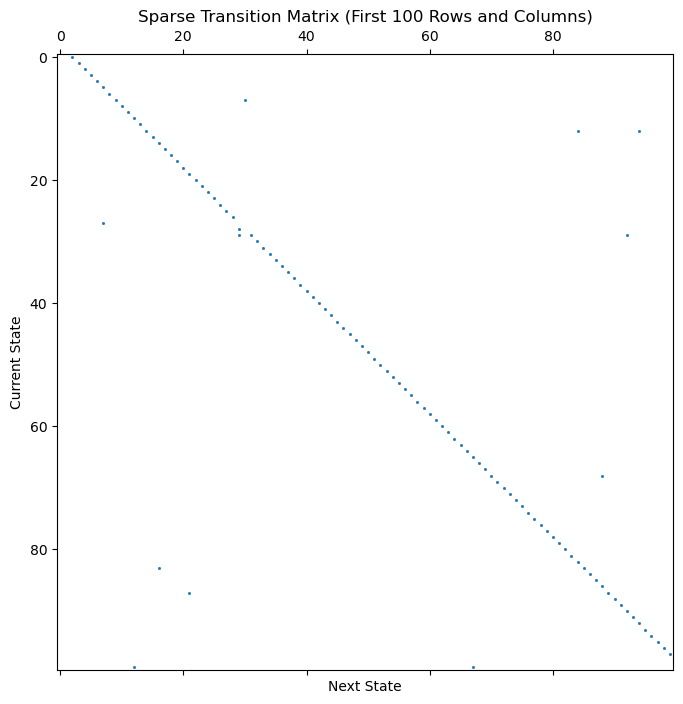

In [82]:
# first 100 matrix values
plt.figure(figsize=(10, 8))
plt.spy(sparse_transition_matrix[:100, :100], markersize=1)
plt.title('Sparse Transition Matrix (First 100 Rows and Columns)')
plt.ylabel('Current State')
plt.xlabel("Next State")
plt.show()

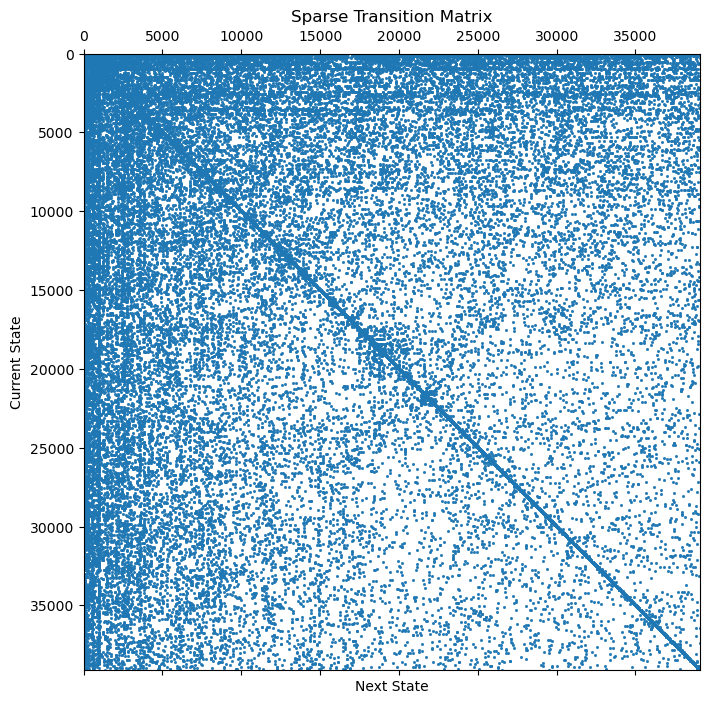

In [154]:
# Sparse matrix visualisation
plt.figure(figsize=(10, 8))
plt.spy(sparse_transition_matrix, markersize=1)
plt.title("Sparse Transition Matrix")
plt.xlabel("Next State")
plt.ylabel("Current State")
plt.show()

In [ ]:
# remeber to add comment to explain thissss 

In [ ]:
# add explenation for presentation, remember also to write a latex paper in which i put my conclusion for this probability project

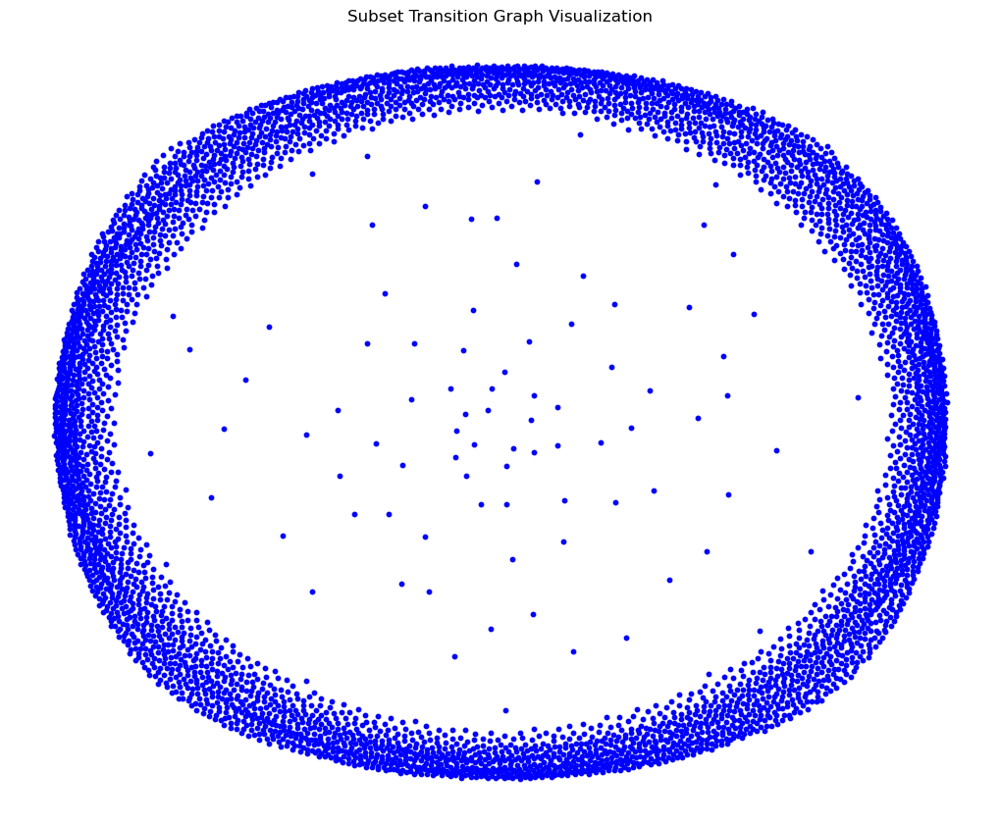

In [153]:
subset_size = 5000  # <-- modify
G = nx.DiGraph()
G.add_nodes_from(range(10000))

# random subset
nodes_list = list(G.nodes())
subset_nodes = random.sample(nodes_list, subset_size)
subset_edges = [(u, v) for u, v in G.edges() if u in subset_nodes and v in subset_nodes]

subset_graph = nx.DiGraph()

# Add nodes
subset_graph.add_nodes_from(subset_nodes)

# Add edges
subset_graph.add_edges_from(subset_edges)

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(subset_graph)
nx.draw(subset_graph, pos, with_labels=False, node_size=10, node_color='blue', edge_color='gray', arrowsize=1)
plt.title('Subset Transition Graph (nodes visualisation)')
plt.show()

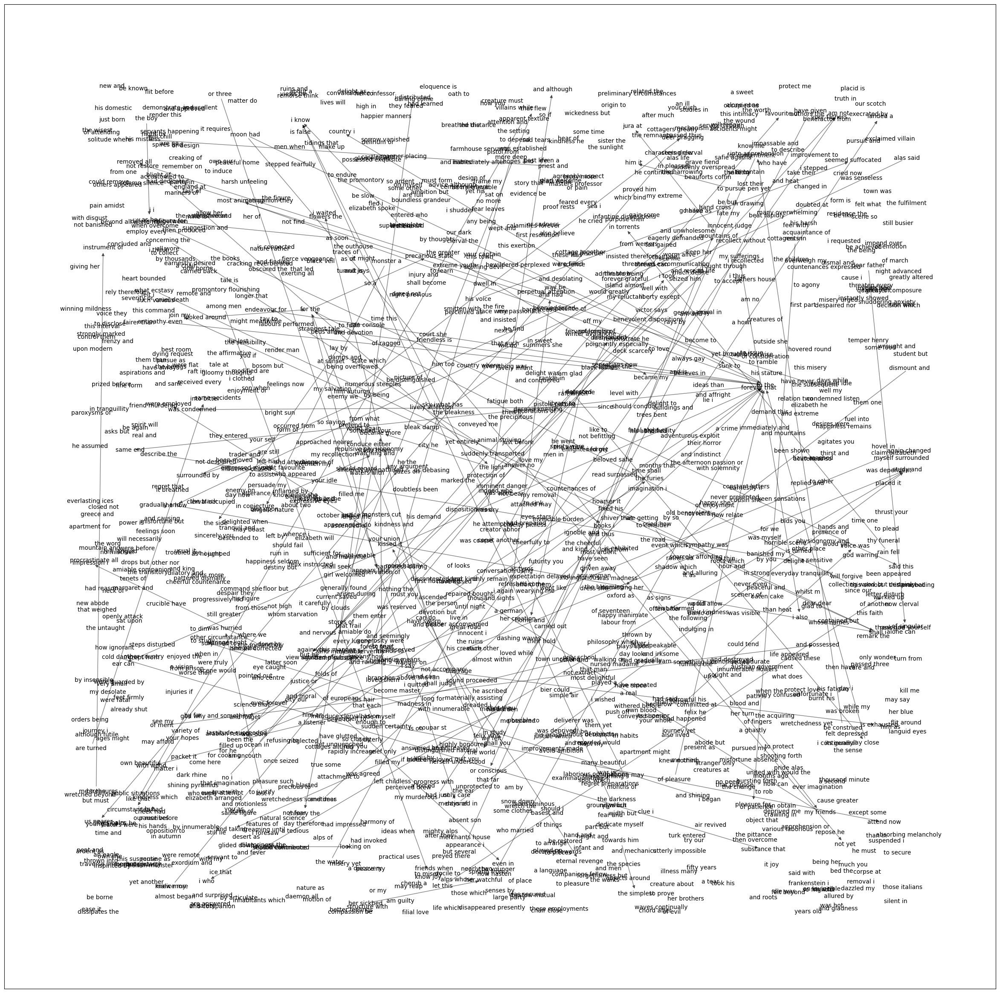

In [143]:
num_selected_states = 1500  # <-- modify
selected_states = random.sample(states_list, num_selected_states)

G = nx.DiGraph()

# Adding nodes
for state in selected_states:
    G.add_node(state)

# Adding edges
row_indices, col_indices, values = find(sparse_transition_matrix)
for i, j, value in zip(row_indices, col_indices, values):
    if states_list[i] in selected_states and states_list[j] in selected_states:
        G.add_edge(states_list[i], states_list[j], weight=value)

# Generation of random positions for nodes
pos = {state: [random.uniform(0, 10), random.uniform(0, 10)] for state in selected_states}

plt.figure(figsize=(30, 30))
plt.title('Subset Transition Graph (labels visualisation)')
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
nx.draw_networkx_labels(G, pos,  font_size=10)
plt.axis('on')
plt.show()

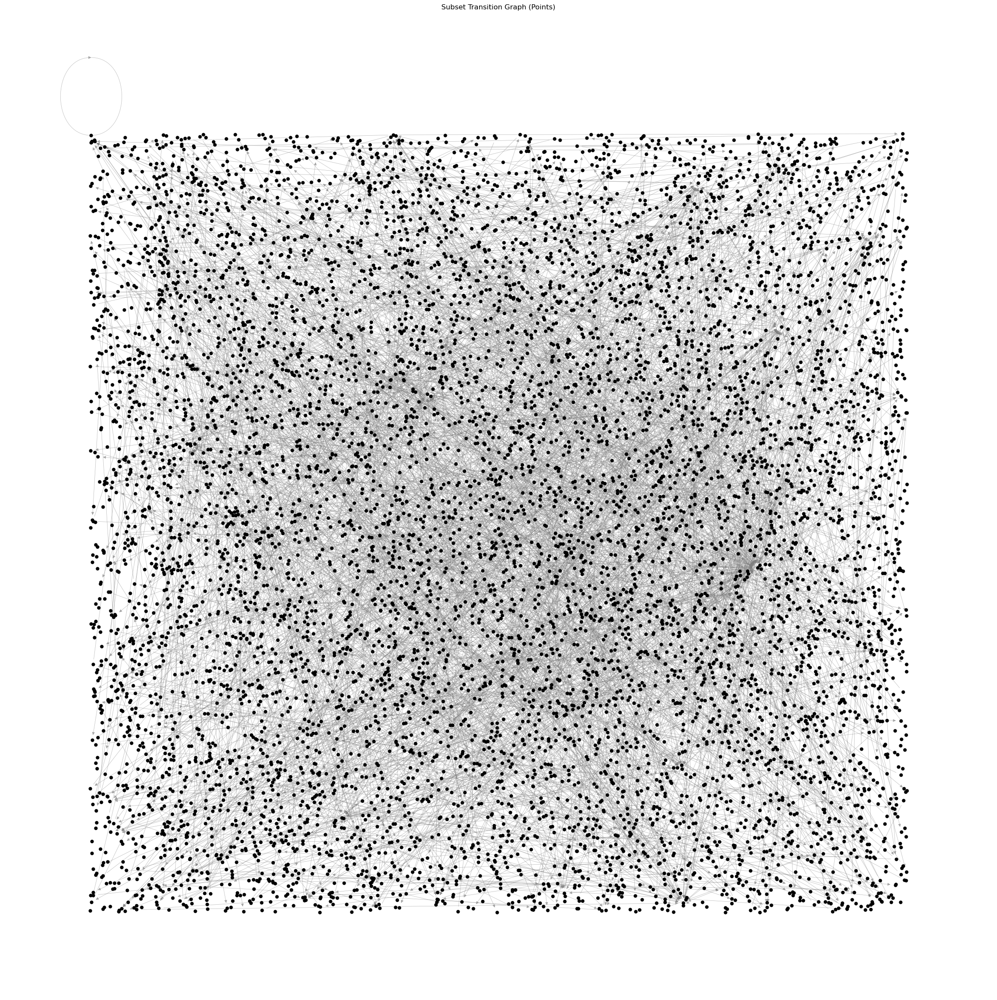

In [146]:
# Select random subset
num_selected_states = 8000  # <-- modify
selected_states = random.sample(states_list, num_selected_states)

G = nx.DiGraph()

# Adding nodes
for state in selected_states:
    G.add_node(state)

# Adding edges
row_indices, col_indices, values = find(sparse_transition_matrix)
for i, j, value in zip(row_indices, col_indices, values):
    if states_list[i] in selected_states and states_list[j] in selected_states:
        G.add_edge(states_list[i], states_list[j], weight=value)

# Generation of random positions for nodes
pos = {state: [random.uniform(0, 10), random.uniform(0, 10)] for state in selected_states}

plt.figure(figsize=(30, 30))
plt.title('Subset Transition Graph (Points)')
node_size = 25
nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='black')
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.6, edge_color='gray')
plt.axis('off')
plt.show()

### **Generating Text**

In [ ]:
# def function

In [ ]:
# try sometimes and see how the model work